
# **Pricing Diamonds with the 4 C's** 
---

*By: Kyle W. Brown*

## **Problem Statement**

Pricing diamonds is notoriously difficult, especially for brokers. A diamond can be the same size and same weight but priced thousands of dollars differently. This poses significant challenges to setting the fair market value of diamonds. 


<center>
<figure>
<p float="left">&nbsp;&nbsp;&nbsp;
  <img src="https://images-aka.jared.com/jared/education/carat-weight-explained/The%20diamond%20carat%20weight%20system%20explained_Img-DiamondWeightChart-Mobile.jpg" width="175" />
  <img src="https://www.diamondbuild.co.uk/wp-content/uploads/2019/07/Diamond-Clarity-Scale.jpg" width="425" height="300" /> 
</p>
</figure>
</center>

## **Value Proposition**

Give diamond brokers insights into how diamonds are priced. The objective is to provide a tool such as a dashboard that will give greater understanding of how diamonds may be priced. 

### **Problems**

The problems faced during this analysis include:

1. Determining the relationship to the 4 C's and pricing, or any identifiable patterns?
2. How are the 4 C's distributed across the data?
3. How to address the `cut`, `color`, and `clarity` categorical variables?
4. How accurate can the price of diamonds be predicted?


### **Solutions**

1. There appears to be an inverse pricing pattern with the pricing of diamonds with the 4 C's. When comparing the relationship of best `color` with the best `clarity` diamonds, we see that the average `price` (&#36;8,307) significantly higher to the rest of the pivot table. 
2. There is correlations among the features, and as a whole the data demostrates not normal distributions. 
3. Addressed the `cut`, `color`, and `clarity` categorical variables with ordinal encoding of 1-5 (`cut`), 1-7 (`color`), and 1-8 (`clarity`) from best to worst across the variables. 
4. Based on the best performing model, `price` can be predicted quite accurately with a 99% predicted performance.  

**Suggestable patterns include:**
  * The inverse pricing pattern is first observed with the average `price` of diamonds by `color` going from lowest to highest, similarities with `cut` and `clarity` continue as well.
  * The inverse pricing is due the `carat` size increase from best to worst diamonds across `cut`, `color`, and `clarity`.
  * The worst `cut`, `color`, and `clarity` diamonds have the highest prices.
  * The best `cut`, `color`, and `clarity` diamonds are among the smallest `carat` in the dataset. 

In [87]:
import pandas as pd 
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
sns.set()

In [88]:
diamonds = "https://raw.githubusercontent.com/kyle-w-brown/diamonds-prediction/main/data/diamonds.csv"
df_diamonds = pd.read_csv(diamonds)
df_diamonds.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [ ]:
df_diamonds.shape

(53940, 10)

Almost 54,000 rows in the dataset.

In [ ]:
df_diamonds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  object 
 2   color    53940 non-null  object 
 3   clarity  53940 non-null  object 
 4   depth    53940 non-null  float64
 5   table    53940 non-null  float64
 6   price    53940 non-null  int64  
 7   x        53940 non-null  float64
 8   y        53940 non-null  float64
 9   z        53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB


Consolidating `x`, `y`, and `z` into `volume`.

In [89]:
df_diamonds['volume'] = round(df_diamonds['x'] * df_diamonds['y'] * df_diamonds['z'], 2)
df_diamonds.head()

,carat,cut,color,clarity,depth,table,price,x,y,z,volume
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43,38.20
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31,34.51
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31,38.08
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63,46.72
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75,51.92


## **Data Cleansing**

---

In [90]:
df_diamonds[['x','y','z','volume']] = df_diamonds[['x','y','z','volume']].replace(0, np.NaN)
df_diamonds.isnull().sum()

carat       0
cut         0
color       0
clarity     0
depth       0
table       0
price       0
x           8
y           7
z          20
volume     20
dtype: int64

Removing missing data

In [91]:
df_diamonds.dropna(inplace=True)
df_diamonds.isnull().sum()

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
x          0
y          0
z          0
volume     0
dtype: int64

### **Outliers**

Removing the outliers

In [92]:
df_diamonds = df_diamonds[(df_diamonds["carat"] <= 5)]
df_diamonds = df_diamonds[(df_diamonds["depth"] < 75) & (df_diamonds["depth"] > 45)]
df_diamonds = df_diamonds[(df_diamonds["table"] < 75) & (df_diamonds["table"] > 45)]
df_diamonds = df_diamonds[(df_diamonds["x"] < 30) & (df_diamonds["x"] > 2)]
df_diamonds = df_diamonds[(df_diamonds["y"] < 30) & (df_diamonds["y"] > 2)]
df_diamonds = df_diamonds[(df_diamonds["z"] < 30) & (df_diamonds["z"] > 2)]
df_diamonds = df_diamonds[(df_diamonds["volume"] < 3500)]
df_diamonds.shape

(53902, 11)

## **Exploration**

---

In [48]:
df = df_diamonds.describe()

heading_properties = [('font-size', '11px')]

cell_properties = [('font-size', '11px')]

dfstyle = [dict(selector="th", props=heading_properties),\
 dict(selector="td", props=cell_properties)]

df.style.set_table_styles(dfstyle)

,carat,depth,table,price,x,y,z,volume
count,53902.000000,53902.000000,53902.000000,53902.000000,53902.000000,53902.000000,53902.000000,53902.000000
mean,0.797555,61.749434,57.455694,3930.426793,5.731398,5.733239,3.539387,129.790389
std,0.473433,1.419670,2.221249,3986.883678,1.119202,1.111083,0.691292,76.399565
min,0.200000,50.800000,49.000000,326.000000,3.730000,3.680000,2.060000,31.710000
25%,0.400000,61.000000,56.000000,949.000000,4.710000,4.720000,2.910000,65.190000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000,114.840000
75%,1.040000,62.500000,59.000000,5322.000000,6.540000,6.540000,4.040000,170.840000
max,4.500000,73.600000,73.000000,18823.000000,10.230000,10.160000,6.720000,698.460000


Looking at the data we see that the average `carat` size is 0.8 and the largest `carat` is 4.5. The average `price` per diamond is almost &#36;4,000, while the most expensive diamond is priced at &#36;18,823. 

### **Exploring the Categorical Variables**

In [ ]:
df_diamonds['cut'].unique()

array(['Ideal', 'Premium', 'Good', 'Very Good', 'Fair'], dtype=object)

In [ ]:
df_diamonds['clarity'].unique()

array(['SI2', 'SI1', 'VS1', 'VS2', 'VVS2', 'VVS1', 'I1', 'IF'],
      dtype=object)

In [ ]:
df_diamonds['color'].unique()

array(['E', 'I', 'J', 'H', 'F', 'G', 'D'], dtype=object)

In [ ]:
df_diamonds.describe(include=object)

,cut,color,clarity
count,53902,53902,53902
unique,5,7,8
top,Ideal,G,SI1
freq,21542,11281,13058


**Counting the values per unique feature**

In [ ]:
df_diamonds['cut'].value_counts()

Ideal        21542
Premium      13779
Very Good    12079
Good          4902
Fair          1600
Name: cut, dtype: int64

According to this printout, the total number of diamonds decrease from best (Ideal) to worst (Fair).

In [ ]:
df_diamonds['color'].value_counts()

G    11281
E     9791
F     9535
H     8296
D     6774
I     5419
J     2806
Name: color, dtype: int64

In [ ]:
df_diamonds['clarity'].value_counts()

SI1     13058
VS2     12250
SI2      9183
VS1      8165
VVS2     5066
VVS1     3654
IF       1790
I1        736
Name: clarity, dtype: int64

### **Reordering `cut`, `color`, and `clarity` categorical variables from best to worst**

In [78]:
df_diamonds['cut'] = pd.Categorical(df_diamonds['cut'], ["Ideal", "Premium", "Very Good", "Good", "Fair"])
df_diamonds = df_diamonds.sort_values('cut')

In [79]:
df_diamonds['color'] = pd.Categorical(df_diamonds['color'], ["D", "E", "F", "G", "H", "I", "J"])
df_diamonds = df_diamonds.sort_values('color')

In [80]:
df_diamonds['clarity'] = pd.Categorical(df_diamonds['clarity'], ["IF", "VVS1", "VVS2", "VS1", "VS2", "SI1", "SI2", "I1"])
df_diamonds = df_diamonds.sort_values('clarity')

**Average price for `cut`, `color`, and `clarity`** 

In [ ]:
cut_avg = round(df_diamonds.groupby('cut')['price'].mean().reset_index(), 2)
cut_avg

,cut,price
0,Ideal,3456.21
1,Premium,4579.13
2,Very Good,3982.12
3,Good,3926.40
4,Fair,4350.67


The best `cut` (Ideal) diamonds have the lowest average price. 

In [ ]:
color_avg = round(df_diamonds.groupby('color', as_index=False)['price'].mean(), 2)
color_avg

,color,price
0,D,3168.11
1,E,3077.52
2,F,3723.99
3,G,3997.05
4,H,4479.38
5,I,5089.27
6,J,5319.49


The worst `color` (J) diamonds have the highest average price. 

In [ ]:
clarity_avg = round(df_diamonds.groupby('clarity', as_index=False)['price'].mean(), 2)
clarity_avg

,clarity,price
0,IF,2864.84
1,VVS1,2519.51
2,VVS2,3283.74
3,VS1,3839.14
4,VS2,3923.01
5,SI1,3993.02
6,SI2,5059.96
7,I1,3910.66


### **Comparing the 4'C's with Pivot Tables**

Comparing `cut`, `color`, and `clarity` variables with `price` and `carat` in pivot tables.

#### **Tables of `Cut` and `Clarity`**

In [85]:
cut_clarity = df_diamonds.pivot_table('price', index='cut', columns='clarity')

heading_properties = [('font-size', '11px')]

cell_properties = [('font-size', '11px')]

dfstyle = [dict(selector="th", props=heading_properties),\
 dict(selector="td", props=cell_properties)]

cut_clarity.style.set_table_styles(dfstyle)

clarity,IF,VVS1,VVS2,VS1,VS2,SI1,SI2,I1
cut,,,,,,,,
Ideal,2272.913366,2468.129458,3250.290100,3487.972393,3281.928374,3750.394860,4755.876396,4335.726027
Premium,3856.143478,2810.304065,3795.122989,4485.462041,4546.261919,4448.621886,5539.047910,3958.881773
Very Good,4396.216418,2459.441065,3037.765182,3808.267343,4215.403089,3932.391049,4988.688095,4078.226190
Good,4098.323944,2254.774194,3079.108392,3801.445988,4262.236196,3689.533333,4571.627087,3584.694737
Fair,1912.333333,3871.352941,3349.768116,4152.029586,4187.647287,4191.592593,5180.094624,3646.451923


We see that the best `cut` (**Ideal**) and the best `color` (**IF**) diamonds are priced at the third lowest across the entire table. 

In [84]:
cut_clarity_ct = df_diamonds.pivot_table('carat', index='cut', columns='clarity')

heading_properties = [('font-size', '13px')]

cell_properties = [('font-size', '13px')]

dfstyle = [dict(selector="th", props=heading_properties),\
 dict(selector="td", props=cell_properties)]

cut_clarity_ct.style.set_table_styles(dfstyle)

clarity,IF,VVS1,VVS2,VS1,VS2,SI1,SI2,I1
cut,,,,,,,,
Ideal,0.455041,0.495960,0.586213,0.674453,0.670213,0.801575,1.007901,1.222671
Premium,0.603478,0.533740,0.654724,0.793308,0.833421,0.907865,1.143252,1.289212
Very Good,0.618769,0.494588,0.566389,0.733683,0.811108,0.845978,1.064338,1.281905
Good,0.616338,0.502312,0.614930,0.757685,0.850787,0.830397,1.034193,1.199895
Fair,0.474444,0.664706,0.691594,0.878284,0.887791,0.962395,1.204688,1.345048


This table indicates that `carat`'s are increasing from the best `clarity` to the worst `clarity` diamonds. What's interesting is we see this pattern across all `cut` diamonds.  

#### **Tables of `cut` and `color`**

In [83]:
cut_color = df_diamonds.pivot_table('price', index='cut', columns='color')

heading_properties = [('font-size', '12px')]

cell_properties = [('font-size', '12px')]

dfstyle = [dict(selector="th", props=heading_properties),\
 dict(selector="td", props=cell_properties)]

cut_color.style.set_table_styles(dfstyle)

color,D,E,F,G,H,I,J
cut,,,,,,,
Ideal,2629.094566,2597.684008,3373.863755,3718.469070,3887.452152,4449.548541,4918.343017
Premium,3623.767790,3538.914420,4325.099571,4502.207806,5195.375531,5939.557814,6294.591584
Very Good,3470.467284,3216.314012,3778.820240,3872.753806,4535.059243,5255.879568,5103.513274
Good,3405.382175,3423.644159,3498.761852,4105.907940,4276.254986,5078.532567,4574.172638
Fair,4291.061350,3703.248869,3801.087097,4241.022581,5135.683168,4685.445714,4865.127119


An inverse pricing pattern is emerging with the best `cut` and best `color` diamonds being priced the lowest. As we see there is an increase in price almost among all the features going from best to worst (one would expect to see the opposite).  

In [ ]:
df_diamonds.pivot_table('carat', index='cut', columns='color')

color,D,E,F,G,H,I,J
cut,,,,,,,
Ideal,0.565766,0.578419,0.655612,0.700447,0.799329,0.912673,1.063564
Premium,0.721248,0.717745,0.826957,0.841250,1.014087,1.144163,1.293094
Very Good,0.696424,0.676547,0.740961,0.766799,0.915902,1.046952,1.133215
Good,0.744517,0.745134,0.776075,0.847906,0.914729,1.057222,1.099544
Fair,0.920123,0.859050,0.901452,1.024355,1.219175,1.198057,1.310085


As we see that with the best `cut` (**Ideal**) and the best `color` (**D**) diamonds have an average price lower than the worst `cut` diamonds. This is due to the best `cut` and `color` diamonds are around a half (0.5) carat, while the worst `cut` (**Fair**) and the worst `color` (**J**) diamonds have the highest average carat at <u>**1.31**</u>.   

#### **Tables of `color` and `clarity`**

In [82]:
color_clarity = df_diamonds.pivot_table('price', index='color', columns='clarity')

heading_properties = [('font-size', '11px')]

cell_properties = [('font-size', '11px')]

dfstyle = [dict(selector="th", props=heading_properties),\
 dict(selector="td", props=cell_properties)]

color_clarity.style.set_table_styles(dfstyle)

clarity,IF,VVS1,VVS2,VS1,VS2,SI1,SI2,I1
color,,,,,,,,
D,8307.369863,2897.163347,3351.128391,3030.158865,2587.225692,2976.146423,3931.101460,3863.023810
E,3668.506329,2219.820122,2499.674067,2859.463224,2751.081037,3161.838005,4173.826036,3510.465347
F,2750.836364,2804.276567,3475.512821,3796.717742,3756.795093,3708.651480,4476.996259,3342.181818
G,2558.033774,2866.820821,3845.283437,4130.314392,4412.354096,3775.574468,5014.848544,3545.540541
H,2287.869565,1845.658120,2649.067434,3775.576199,4713.943327,5027.035620,6084.141667,4461.403727
I,1994.937063,2034.861972,2968.232877,4632.805411,5690.505560,5345.414909,7002.649123,4302.184783
J,3363.882353,4034.175676,5142.396947,4884.461255,5311.789041,5186.048000,6520.958246,4993.571429


The best `color` and best `clarity` diamonds have an average price that is significantly higher than the rest of the variables. Beyond this observation we begin to see that average `price` are among the highest with **SI2** diamonds. 

In [81]:
color_clarity_ct = df_diamonds.pivot_table('carat', index='color', columns='clarity')

heading_properties = [('font-size', '13px')]

cell_properties = [('font-size', '13px')]

dfstyle = [dict(selector="th", props=heading_properties),\
 dict(selector="td", props=cell_properties)]

cut_clarity_ct.style.set_table_styles(dfstyle)

clarity,IF,VVS1,VVS2,VS1,VS2,SI1,SI2,I1
cut,,,,,,,,
Ideal,0.455041,0.495960,0.586213,0.674453,0.670213,0.801575,1.007901,1.222671
Premium,0.603478,0.533740,0.654724,0.793308,0.833421,0.907865,1.143252,1.289212
Very Good,0.618769,0.494588,0.566389,0.733683,0.811108,0.845978,1.064338,1.281905
Good,0.616338,0.502312,0.614930,0.757685,0.850787,0.830397,1.034193,1.199895
Fair,0.474444,0.664706,0.691594,0.878284,0.887791,0.962395,1.204688,1.345048


The trend continues with the increase of `carat` size from best to worst diamonds. Except when compared with the best `color` and the best `clarity` diamonds, the `carat` size among the best `clarity` (**IF**) diamonds are almost equal to the highest `carat` across the `color` diamonds. In other words, the best `color` (**D**) diamond is only a fraction less than the largest diamond among the best `clarity` (**IF**) category.     

## **Visualization**

---

### **Barplots**

#### **Barplot of `cut`**

In [ ]:
import plotly.express as px

clr = ['rgb(115, 185, 238)', 'rgb(84, 148, 218)', 'rgb(51, 115, 196)', 
       'rgb(23, 80, 172)', 'rgb(0, 51, 150)', 'rgb(0, 26, 80)']

fig = px.bar(cut_avg, 
             x='cut', 
             y='price', 
             color='cut',
             color_discrete_sequence=clr)

fig.update_layout(showlegend=False)
fig.show()

#### **Barplot of `color`**

In [ ]:
import plotly.express as px

color = ['rgb(134, 206, 250)', 'rgb(115, 185, 238)', 'rgb(84, 148, 218)', 
         'rgb(51, 115, 196)', 'rgb(23, 80, 172)', 'rgb(0, 51, 150)', 
         'rgb(0, 26, 80)']

fig = px.bar(color_avg, 
             x='color', 
             y='price', 
             color='color',
             color_discrete_sequence=color)

fig.update_layout(showlegend=False)
fig.show()

#### **Barplot of `clarity`**

In [ ]:
import plotly.express as px

colors = ['rgb(134, 206, 250)', 'rgb(115, 185, 238)', 'rgb(61, 136, 238)', 
          'rgb(84, 148, 218)', 'rgb(51, 115, 196)', 'rgb(23, 80, 172)', 
          'rgb(0, 51, 150)', 'rgb(0, 26, 80)']

fig = px.bar(clarity_avg, 
             x='clarity', 
             y='price', 
             color='clarity',
             color_discrete_sequence=colors)

fig.update_layout(showlegend=False)
fig.show()

### **Pairplot**

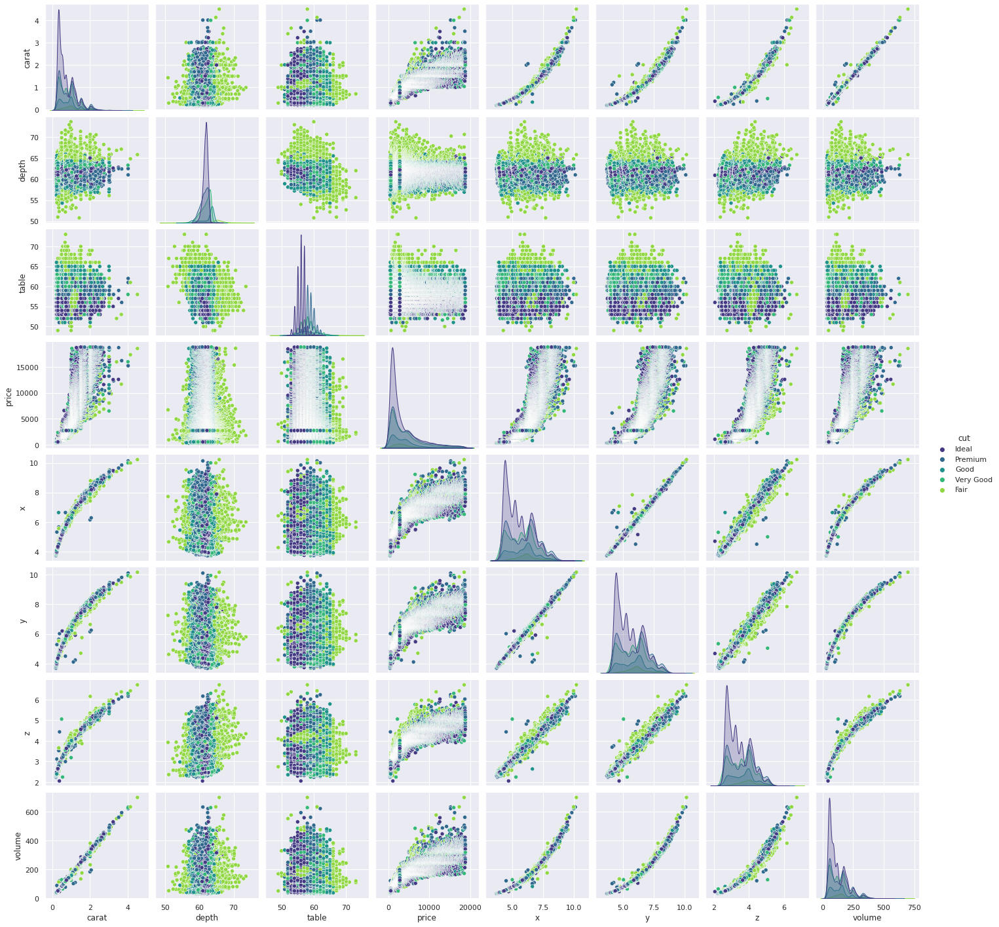

In [ ]:
ax = sns.pairplot(df_diamonds, 
                  hue= "cut",
                  palette = 'viridis')

### **Historgram**

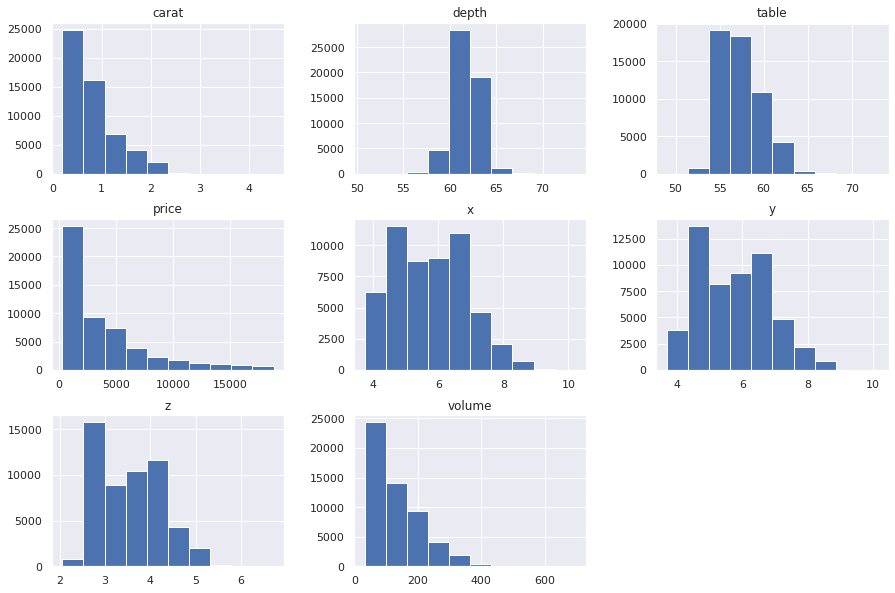

In [ ]:
df_diamonds.hist(layout=(3,3), figsize=(15,10))
plt.show()

#### **Histogram `carat`**

Taking a closer look at `carat`'s distribution.

In [ ]:
import plotly.express as px

fig = px.histogram(df_diamonds, 
                   x="carat", 
                   marginal="violin",
                   color_discrete_sequence=['rgb(115, 185, 238)'], 
                   hover_data=df_diamonds.columns)
fig.show()

Notice that the `carat`'s are distributed in increments?

Normalizing `carat`

In [ ]:
import plotly.express as px

fig = px.histogram(df_diamonds, 
                   x="carat", 
                   histnorm='probability',
                   color_discrete_sequence=['rgb(115, 185, 238)'] 
                   )
fig.show()

The highest probability of `carat`'s fall between 0.3 and 1.1

### **Boxplots**

In [77]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

vars = ['carat', 'depth', 'table', 'price', 'x', 'y', 'z', 'volume']
fig = make_subplots(rows=1, cols=len(vars))
for i, var in enumerate(vars):
    fig.add_trace(
        go.Box(y=df_diamonds[var],
        name=var),
        row=1, col=i+1
    )

fig.update_traces(showlegend=False)

#### **Boxplot of `cut`**

In [ ]:
import plotly.express as px

fig = px.box(data_frame = df_diamonds,
             x = 'cut',
             y = 'price', 
             color='cut',
             category_orders={"cut": ["Ideal", "Premium", "Very Good", "Good", "Fair"]},
             color_discrete_sequence=clr)

fig.update_layout(showlegend=False)
fig.show()

#### **Boxplot of `color`**

In [ ]:
import plotly.express as px

fig = px.box(data_frame = df_diamonds,
             x = 'color',
             y = 'price', 
             color='color',
             category_orders={"color": ["D", "E", "F", "G", "H", "I", "J"]},
             color_discrete_sequence=color)

fig.update_layout(showlegend=False)
fig.show()

#### **Boxplot of `clarity`**

In [ ]:
import plotly.express as px

fig = px.box(data_frame = df_diamonds,
             x = 'clarity',
             y = 'price', 
             color='clarity',
             category_orders={"clarity": ["IF", "VVS1", "VVS2", "VS1", "VS2", "SI1", "SI2", "I1"]},
             color_discrete_sequence=colors)

fig.update_layout(showlegend=False)
fig.show()

It's unique that VS1 and VS2 have the same exact inner quartile ranges considering they may be priced thousands of dollars differently. 

### **Ordinal Encoding**

Creating a rank system for `cut`, `color`, and `clarity`. 

In [93]:
# Cut rank
cut_two = pd.DataFrame(df_diamonds['cut'])
df_diamonds['cut_rk']= cut_two.replace({'cut':{'Ideal' : 1, 'Premium' : 2, 'Very Good' : 3, 'Good' : 4, 'Fair' : 5}})

In [94]:
# Color rank
color_two = pd.DataFrame(df_diamonds['color'])
df_diamonds['color_rk']= color_two.replace({'color':{'D' : 1, 'E' : 2, 'F' : 3, 'G' : 4, 'H' : 5, 'I' : 6, 'J' : 7}}) 

In [95]:
# Clarity rank
clarity_two = pd.DataFrame(df_diamonds['clarity'])
df_diamonds['clarity_rk']= clarity_two.replace({'clarity':{'IF' : 1, 'VVS1' : 2, 'VVS2' : 3, 'VS1' : 4, 'VS2' : 5, 'SI1' : 6, 'SI2' : 7, 'I1' : 8}}) 

### **Examining the Ranks of `cut`, `color`, and `clarity`**

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

vars = ['cut_rk', 'color_rk', 'clarity_rk']
fig = make_subplots(rows=1, cols=len(vars))
for i, var in enumerate(vars):
    fig.add_trace(
        go.Box(y=df_diamonds[var],
        name=var),
        row=1, col=i+1
    )

fig.update_layout()
fig.update_traces(showlegend=False)

### **Correlation Heatmap**

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import numpy as np

df_corr = df_diamonds.corr() 

fig = go.Figure()

fig.add_trace(
    go.Heatmap(
        x = df_corr.columns,
        y = df_corr.index,
        z = np.array(df_corr),
        colorscale='Viridis'
    )
)

## **Models**

---

In [ ]:
import warnings
from sklearn.exceptions import ConvergenceWarning

warnings.simplefilter("ignore", ConvergenceWarning)

Slicing the data for numeric columns and removing highly correlated `x`, `y`, and `z`.

In [96]:
df = df_diamonds.drop(df_diamonds.columns[[1, 2, 3, 7, 8, 9]], axis=1)
df.head()

,carat,depth,table,price,volume,cut_rk,color_rk,clarity_rk
0,0.23,61.5,55.0,326,38.20,1,2,7
1,0.21,59.8,61.0,326,34.51,2,2,6
2,0.23,56.9,65.0,327,38.08,4,2,4
3,0.29,62.4,58.0,334,46.72,2,6,5
4,0.31,63.3,58.0,335,51.92,4,7,7


With `price` reaching as high as &#36;18,823 and `carat` as low as 0.21, we will need to scale the features.

In [100]:
from sklearn.preprocessing import StandardScaler

standard_scaler = StandardScaler()

df_diamonds_scaled = pd.DataFrame(standard_scaler.fit_transform(df),
                                          columns=df.columns)
df_scaled = df_diamonds_scaled.head()

heading_properties = [('font-size', '13px')]

cell_properties = [('font-size', '13px')]

dfstyle = [dict(selector="th", props=heading_properties),\
 dict(selector="td", props=cell_properties)]

df_scaled.style.set_table_styles(dfstyle)

,carat,depth,table,price,volume,cut_rk,color_rk,clarity_rk
0,-1.198817,-0.175700,-1.105557,-0.904080,-1.198845,-0.981476,-0.936934,1.245681
1,-1.241062,-1.373172,1.595652,-0.904080,-1.247144,-0.085459,-0.936934,0.638536
2,-1.198817,-3.415919,3.396457,-0.903829,-1.200416,1.706574,-0.936934,-0.575752
3,-1.072082,0.458256,0.245047,-0.902073,-1.087325,-0.085459,1.414295,0.031392
4,-1.029837,1.092211,0.245047,-0.901822,-1.019261,1.706574,2.002102,1.245681


### **Linear Regression**

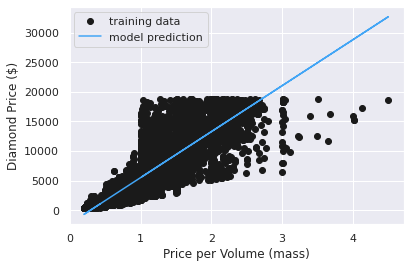

In [ ]:
from sklearn.linear_model import LinearRegression
from numpy import *

X = df_diamonds[['carat']]
y = df_diamonds['price']

lr = LinearRegression()   
lr.fit(X, y)             

y_pred = lr.predict(X)

plt.plot(X, y, 'o', color = 'k', label='training data')
plt.plot(X, y_pred, color='#42a5f5ff', label='model prediction')
plt.xlabel('Price per Volume (mass)')
plt.ylabel('Diamond Price ($)')
plt.legend();

In [ ]:
from sklearn import metrics

# Using scaled features
X = df_diamonds_scaled[['carat']]
y = df_diamonds_scaled['price']

lr = LinearRegression()   
lr.fit(X, y)             

y_pred = lr.predict(X)

print("Mean absolute error (MAE):", metrics.mean_absolute_error(y, y_pred))
print("Mean squared error (MSE):", metrics.mean_squared_error(y, y_pred))
print("Root Mean squared error (RMSE):", np.sqrt(metrics.mean_squared_error(y, y_pred)))
print("R^2:", metrics.r2_score(y, y_pred))

Mean absolute error (MAE): 0.252631690580942
Mean squared error (MSE): 0.15029971977032106
Root Mean squared error (RMSE): 0.3876850780857074
R^2: 0.8497002802296789


### **Multiple Linear Regression**

In [ ]:
features = ['carat', 'depth','table', 'volume', 'cut_rk', 'color_rk', 'clarity_rk']
X = df_diamonds_scaled[features]
y = df_diamonds_scaled['price']

lr_many_features = LinearRegression()
lr_many_features.fit(X, y);

In [ ]:
print(('prediction = ' +
       '{} +\n'.format(lr_many_features.intercept_) +
       ' +\n'.join(['{} * {}'.format(n, f) for f, n in zip(features, lr_many_features.coef_)])))

prediction = -1.0455101613761209e-16 +
0.11935791009746087 * carat +
0.0036623212292048457 * depth +
-0.0006422984576671814 * table +
0.9229942229753505 * volume +
-0.03152197675314965 * cut_rk +
-0.1359159833047961 * color_rk +
-0.21507245231196492 * clarity_rk


In [ ]:
print('Multiple features linear model R^2 on training data set: {}'.format(lr_many_features.score(X, y)))

Multiple features linear model R^2 on training data set: 0.9059466891034228


### **Random Forest**

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=321)

In [ ]:
from sklearn.ensemble import RandomForestRegressor

forest  = RandomForestRegressor(random_state = random.seed(1234))
model = forest.fit(X_train,y_train)
y_pred = model.predict(X_test)

In [ ]:
from sklearn.metrics import mean_squared_error

print("RMSE: {}".format(np.sqrt(mean_squared_error((y_test),(y_pred)))))
print("R2  : {}".format(np.sqrt(metrics.r2_score((y_test),(y_pred)))))

RMSE: 0.13225034160421884
R2  : 0.9911725406670384


In [ ]:
import time

start_time = time.time()
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)
elapsed_time = time.time() - start_time

print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

Elapsed time to compute the importances: 0.470 seconds


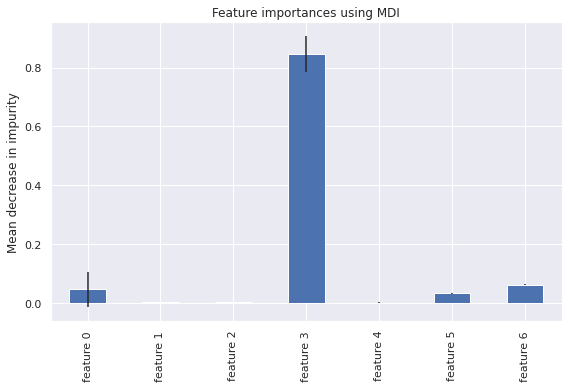

In [ ]:
plt.rcParams["figure.figsize"] = (8,5.5)

feature_names = [f"feature {i}" for i in range(X.shape[1])]
forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

The feature `volume` appears to the highest importance among the Random Forest model. 

In [ ]:
from sklearn.inspection import permutation_importance

start_time = time.time()
result = permutation_importance(
    forest, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(result.importances_mean, index=feature_names)

Elapsed time to compute the importances: 45.103 seconds


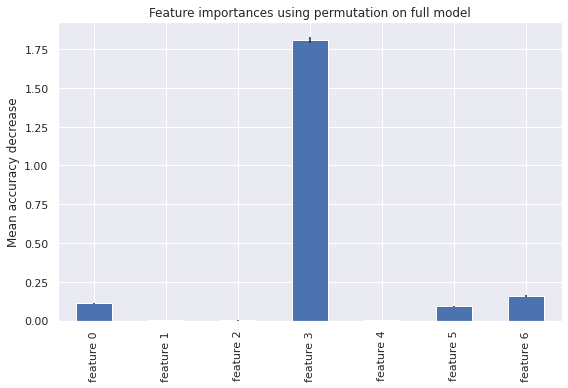

In [ ]:
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

The `volume` feature remains the highest with permutation feature importance which indicates do not have a bias toward high-cardinality features and can be computed on a left-out test set. This demonstrates the `volume` overcomes limitations of the impurity-based feature importance. 

### **Hyperparameter Tuning Random Forest**

In [ ]:
n_estimators = [int(x) for x in np.linspace(10,200,10)]
max_depth = [int(x) for x in np.linspace(10,100,10)]
min_samples_split = [2,3,4,5,10]
min_samples_leaf = [1,2,4,10,15,20]
random_grid = {'n_estimators':n_estimators,'max_depth':max_depth,
               'min_samples_split':min_samples_split,'min_samples_leaf':min_samples_leaf}

random_grid

{'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
 'min_samples_leaf': [1, 2, 4, 10, 15, 20],
 'min_samples_split': [2, 3, 4, 5, 10],
 'n_estimators': [10, 31, 52, 73, 94, 115, 136, 157, 178, 200]}

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from numpy import *

rf = RandomForestRegressor(random_state = random.seed(1234))
rf_random = RandomizedSearchCV(estimator=rf,
                               param_distributions=random_grid,
                               cv = 3)

rf_random.fit(X_train,y_train)
y_pred = rf_random.predict(X_test)

print("RMSE: {}".format(np.sqrt(mean_squared_error((y_test),(y_pred)))))
print("R2  : {}".format(np.sqrt(metrics.r2_score((y_test),(y_pred)))))

RMSE: 0.13627217704239236
R2  : 0.9909164510584496


In [ ]:
rf_random.best_params_

{'max_depth': 30,
 'min_samples_leaf': 2,
 'min_samples_split': 3,
 'n_estimators': 94}

In [ ]:
rf = RandomForestRegressor(max_depth = 30,
                         min_samples_leaf = 2,
                         min_samples_split = 3,
                         n_estimators = 94, 
                         random_state = random.seed(1234))
rf.fit(X_train,y_train)
y_pred = rf.predict(X_test)

print("RMSE: {}".format(np.sqrt(mean_squared_error((y_test),(y_pred)))))
print("R2  : {}".format(np.sqrt(metrics.r2_score((y_test),(y_pred)))))

RMSE: 0.1371532785575916
R2  : 0.9907980602434069


In [ ]:
start_time = time.time()
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)
elapsed_time = time.time() - start_time

print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

Elapsed time to compute the importances: 0.269 seconds


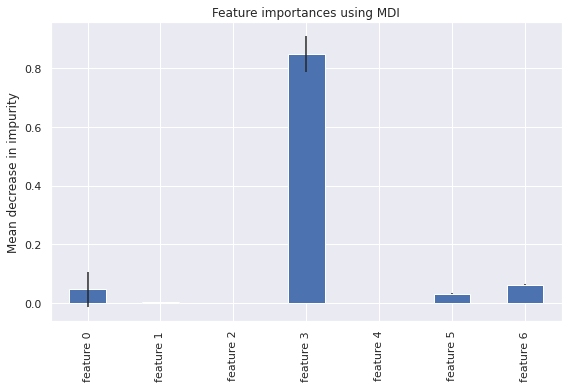

In [ ]:
feature_names = [f"feature {i}" for i in range(X.shape[1])]
forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [ ]:
start_time = time.time()
result = permutation_importance(
    rf, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(result.importances_mean, index=feature_names)

Elapsed time to compute the importances: 23.421 seconds


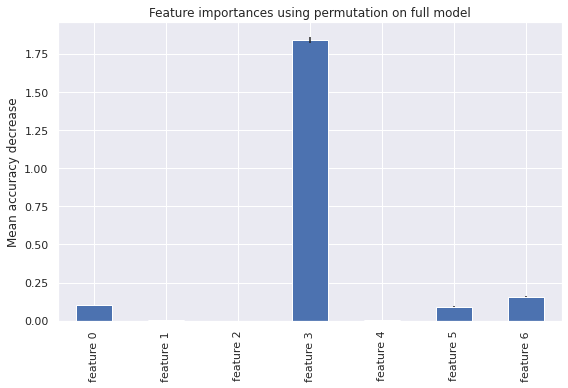

In [ ]:
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

### **AutoML using H20**

In [ ]:
import h2o
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.15" 2022-04-19; OpenJDK Runtime Environment (build 11.0.15+10-Ubuntu-0ubuntu0.18.04.1); OpenJDK 64-Bit Server VM (build 11.0.15+10-Ubuntu-0ubuntu0.18.04.1, mixed mode)
  Starting server from /usr/local/lib/python3.7/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpcavk4j6w
  JVM stdout: /tmp/tmpcavk4j6w/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpcavk4j6w/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.36.1.2
H2O_cluster_version_age:,1 day
H2O_cluster_name:,H2O_from_python_unknownUser_vyy7c7
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:
diamonds = h2o.import_file("/content/diamonds_new.csv")

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
diamonds.describe()

Rows:53902
Cols:14




,carat,cut,color,clarity,depth,table,price,x,y,z,volume,cut_rk,color_rk,clarity_rk
type,real,enum,enum,enum,real,real,int,real,real,real,real,int,int,int
mins,0.2,,,,50.8,49.0,326.0,3.73,3.68,2.06,31.71,1.0,1.0,1.0
mean,0.7975546361916077,,,,61.74943415828728,57.45569366628322,3930.426793068903,5.731397907313265,5.733238655337458,3.539386850209639,129.79038885384568,2.0953767949241198,3.593948276501803,4.948295053986866
maxs,4.5,,,,73.6,73.0,18823.0,10.23,10.16,6.72,698.46,5.0,7.0,8.0
sigma,0.47343323947185206,,,,1.4196703364355991,2.221248682189408,3986.8836775360587,1.1192018720191774,1.111083096761398,0.691292416429462,76.39956459996696,1.1160610424871082,1.7012537757016888,1.6470707425751165
zeros,0,,,,0,0,0,0,0,0,0,0,0,0
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0.23,Ideal,E,SI2,61.5,55.0,326.0,3.95,3.98,2.43,38.2,1.0,2.0,7.0
1,0.21,Premium,E,SI1,59.8,61.0,326.0,3.89,3.84,2.31,34.51,2.0,2.0,6.0
2,0.23,Good,E,VS1,56.9,65.0,327.0,4.05,4.07,2.31,38.08,4.0,2.0,4.0


In [ ]:
diamonds = diamonds[:, ["carat", "depth", "table", "price", "volume", "cut_rk",	"color_rk", "clarity_rk"]]
print(diamonds)

carat,depth,table,price,volume,cut_rk,color_rk,clarity_rk
0.23,61.5,55,326,38.2,1,2,7
0.21,59.8,61,326,34.51,2,2,6
0.23,56.9,65,327,38.08,4,2,4
0.29,62.4,58,334,46.72,2,6,5
0.31,63.3,58,335,51.92,4,7,7
0.24,62.8,57,336,38.69,3,7,3
0.24,62.3,57,336,38.83,3,6,2
0.26,61.9,55,337,42.32,3,5,6
0.22,65.1,61,337,36.43,5,2,5
0.23,59.4,61,338,38.72,3,5,4


#### **GBM Model**

In [ ]:
from h2o.estimators.gbm import H2OGradientBoostingEstimator

# set the predictor names and the response column name
predictors = ["carat",	"depth",	"table",	"volume", "cut_rk",	"color_rk",	"clarity_rk"]	

response = "price"

# split into train and validation sets
train, valid = diamonds.split_frame(ratios = [.8], seed = 1234)

# train a GBM model
diamonds_gbm = H2OGradientBoostingEstimator(distribution = "poisson", seed = 1234)
diamonds_gbm.train(x = predictors,
               y = response,
               training_frame = train,
               validation_frame = valid)

# retrieve the model performance
perf = diamonds_gbm.model_performance(valid)
perf

gbm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%

ModelMetricsRegression: gbm
** Reported on test data. **

MSE: 297175.9346014002
RMSE: 545.1384545245365
MAE: 298.17434419493014
RMSLE: 0.12287040514285516
Mean Residual Deviance: -59961.81794308857


In [ ]:
print('R^2:', diamonds_gbm.r2())
print('R^2 on validation data:', diamonds_gbm.r2(valid=True))

R^2: 0.9814291623069304
R^2 on validation data: 0.9812236569623808


In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
import matplotlib.cbook
warnings.filterwarnings("ignore", category = matplotlib.cbook.mplDeprecation)

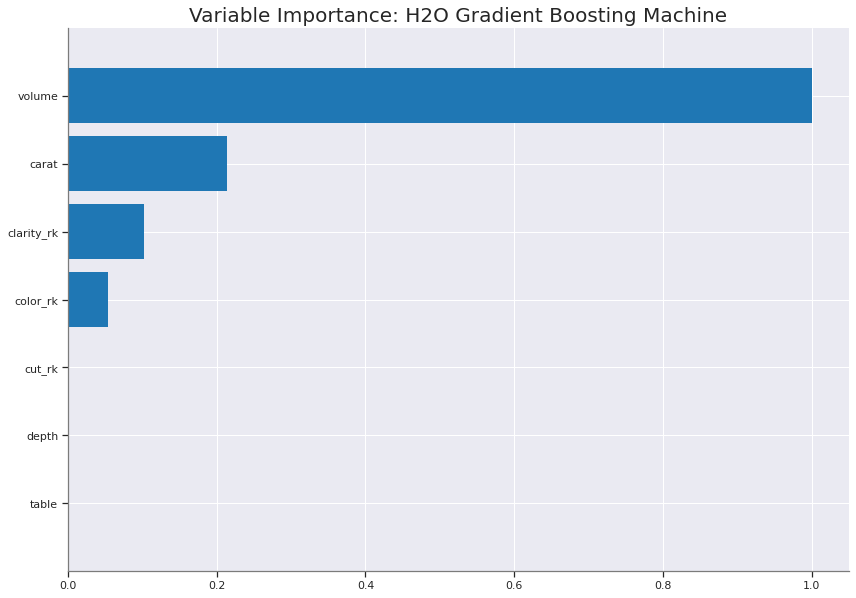

<Figure size 432x288 with 0 Axes>

In [ ]:
diamonds_gbm.varimp_plot();

#### **AutoML Search**

In [ ]:
from h2o.automl import H2OAutoML

y = "price"

splits = diamonds.split_frame(ratios = [0.8], seed = 1)
train = splits[0]
test = splits[1]

In [ ]:
aml = H2OAutoML(max_runtime_secs = 60, seed = 1, project_name = "diamonds_lb_frame")
aml.train(y = y, training_frame = train, leaderboard_frame = test)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_BestOfFamily_2_AutoML_1_20220527_213545

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 163376.48303073455
RMSE: 404.198568813318
MAE: 221.74431915028975
RMSLE: 0.08811328250901963
R^2: 0.9896274225811342
Mean Residual Deviance: 163376.48303073455
Null degrees of freedom: 10063
Residual degrees of freedom: 10060
Null deviance: 158518164125.60925
Residual deviance: 1644220925.2213125
AIC: 149376.76408165455

ModelMetricsRegressionGLM: stackedensemble
** Reported on validation data. **

MSE: 293111.1409579319
RMSE: 541.3973965193514
MAE: 278.7109268472651
RMSLE: 0.10113636742699597
R^2: 0.9823457864836054
Mean Residual Deviance: 293111.1409579319
Null degrees of freedom: 4424
Residual degrees of freedom: 4421
Null deviance: 73479405051.87427


In [ ]:
aml2 = H2OAutoML(max_runtime_secs = 60, seed = 1, project_name = "diamonds_full_data")
aml2.train(y = y, training_frame = diamonds)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_BestOfFamily_3_AutoML_2_20220527_213720

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 143032.15302056298
RMSE: 378.1959188311833
MAE: 207.24916737663557
RMSLE: 0.08235619094213531
R^2: 0.9910408992276571
Mean Residual Deviance: 143032.15302056298
Null degrees of freedom: 10060
Residual degrees of freedom: 10057
Null deviance: 160625531552.78574
Residual deviance: 1439046491.539884
AIC: 147994.2487763461

ModelMetricsRegressionGLM: stackedensemble
** Reported on validation data. **

MSE: 283749.631509217
RMSE: 532.6815479338636
MAE: 272.7611077737793
RMSLE: 0.09844370443884244
R^2: 0.9828274276559079
Mean Residual Deviance: 283749.631509217
Null degrees of freedom: 5459
Residual degrees of freedom: 5456
Null deviance: 90264416715.4349
Resi

In [ ]:
aml.leaderboard.head()

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_BestOfFamily_2_AutoML_1_20220527_213545,532.634,283699,275.046,0.100773,283699
StackedEnsemble_AllModels_1_AutoML_1_20220527_213545,533.505,284627,273.456,0.0994565,284627
GBM_2_AutoML_1_20220527_213545,537.035,288407,280.385,0.103165,288407
GBM_3_AutoML_1_20220527_213545,539.86,291449,277.797,0.0996754,291449
StackedEnsemble_BestOfFamily_1_AutoML_1_20220527_213545,547.002,299211,278.922,0.104543,299211
GBM_4_AutoML_1_20220527_213545,551.679,304349,292.328,0.119531,304349
GBM_1_AutoML_1_20220527_213545,556.845,310076,283.87,0.117353,310076
XGBoost_1_AutoML_1_20220527_213545,567.898,322508,293.092,0.106398,322508
DRF_1_AutoML_1_20220527_213545,590.945,349216,303.673,0.112203,349216
XGBoost_2_AutoML_1_20220527_213545,618.187,382155,345.353,nan,382155


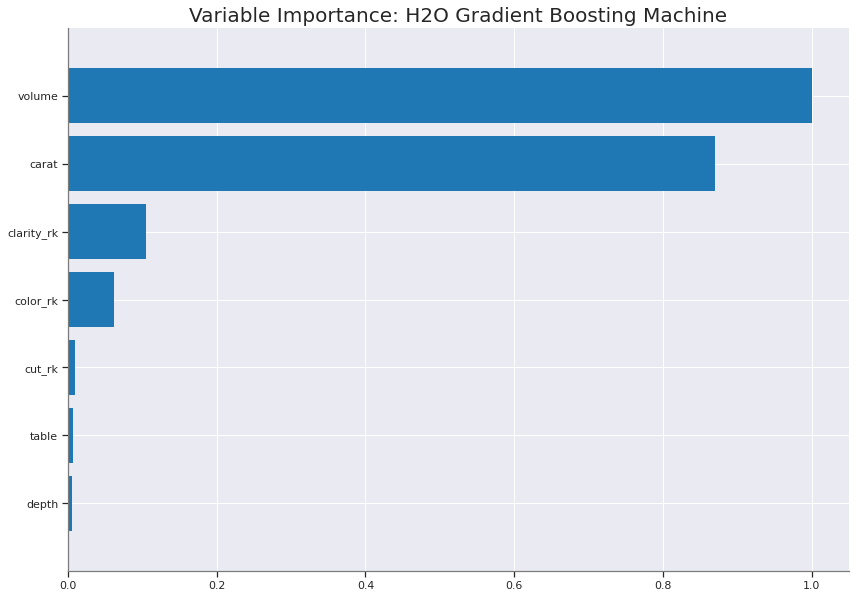

<Figure size 432x288 with 0 Axes>

In [ ]:
best_model_aml = h2o.get_model(aml.leaderboard[2,'model_id'])

best_model_aml.varimp_plot();

In [ ]:
print('GBM_2_AutoML_1 R^2:', best_model_aml.r2())
print('GBM_2_AutoML_1 R^2 on validation data:', best_model_aml.r2(valid=True))

XGBoost_1_AutoML_1 R^2: 0.9868201213956783
XGBoost_1_AutoML_1 R^2 on validation data: 0.9822494320805603


In [ ]:
aml2.leaderboard.head()

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_BestOfFamily_3_AutoML_2_20220527_213720,532.682,283750,272.761,0.0984437,283750
StackedEnsemble_BestOfFamily_2_AutoML_2_20220527_213720,532.682,283750,272.761,0.0984437,283750
StackedEnsemble_AllModels_2_AutoML_2_20220527_213720,532.766,283839,270.812,0.096823,283839
StackedEnsemble_AllModels_1_AutoML_2_20220527_213720,532.766,283839,270.812,0.096823,283839
GBM_2_AutoML_2_20220527_213720,537.9,289337,278.588,0.101383,289337
StackedEnsemble_BestOfFamily_1_AutoML_2_20220527_213720,542.102,293874,276.413,0.0994625,293874
GBM_3_AutoML_2_20220527_213720,542.484,294289,276.929,0.0984264,294289
GBM_1_AutoML_2_20220527_213720,542.522,294330,279.228,0.104282,294330
GBM_4_AutoML_2_20220527_213720,555.048,308078,290.994,0.114923,308078
XGBoost_2_AutoML_2_20220527_213720,561.576,315368,287.206,0.101077,315368


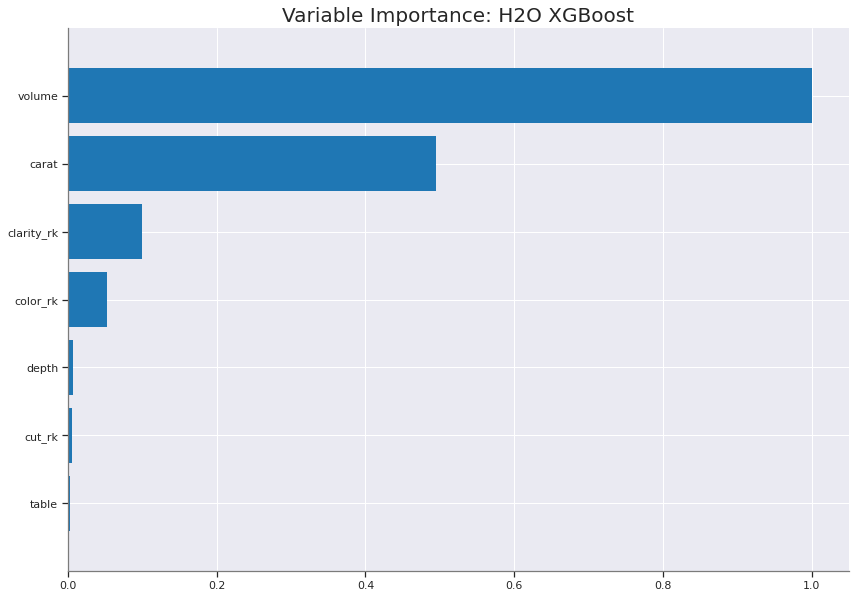

<Figure size 432x288 with 0 Axes>

In [ ]:
best_model_aml2 = h2o.get_model(aml2.leaderboard[9,'model_id'])

best_model_aml2.varimp_plot();

In [ ]:
print('XGBoost_2_AutoML_2 R^2:', best_model_aml2.r2())
print('XGBoost_2_AutoML_2 R^2 on validation data:', best_model_aml2.r2(valid=True))

XGBoost_2_AutoML_2 R^2: 0.9909054467211048
XGBoost_2_AutoML_2 R^2 on validation data: 0.98091389302047


In [ ]:
h2o.cluster().shutdown()

H2O session _sid_b971 closed.


## **Model Results**

---



|           Model                         |    r2    |
|:----------------------------------------|:--------:|
|        Linear_Regression	              |  84.97%	 |   
|       Multiple_Linear_Regression       	|  90.59%	 |  
|          XGBoost_2_AutoML_2	            |  98.09%	 |  
|            GBM_Estimator              	|  98.12%	 |  
| StackedEnsemble_BestOfFamily_2_AutoML_1	|  98.23%	 |
|           GBM_2_AutoML_1               	|  98.22%	 |  
| StackedEnsemble_BestOfFamily_3_AutoML_2	|  98.28%	 |  
|          Random_Forest	                |  99.07%	 |

## **Conclusion**

---

An analysis was performed using the classic `Diamonds` dataset, in which the objective was determining the relationship of 4 C's to price, any identifiable patterns, and how to best price diamonds for brokers. 
- Through exploration and visualization of the data, observed generalized pattern of inverse pricing accompanied with not normal distributions. 
- The clearest indication is the combination of best `color` and best `clarity` diamonds are priced significantly higher, while `cut`, `color`, `clarity` are priced highest from the worst diamonds.   
- Of the 4 C's `carat`'s coefficient level in the multiple linear regression, and among the variable importance compared favorable against the other 4 C's.
- After scaling the features, the baseline linear regression captured a modest 84.97% accuracy, while the Random Forest model scored the highest with 99.07%.
- The final deliverable was a Tableau Dashboard, to assist brokers with visualizations and a potential pricing mechanism to the `Diamonds` dataset. The dashboard can be viewed [here](https://public.tableau.com/app/profile/kyle.w.brown/viz/Diamonds_16516232030110/DiamondsOverview?publish=yes/) 